# Testing Pretrained Models' performances

## A — Quick prototype: DeepFace (simple, one-liner analyzer)

In [1]:
!pip install deepface opencv-python mediapipe numpy

  Using cached numpy-1.23.5-cp311-cp311-win_amd64.whl.metadata (2.3 kB)
INFO: pip is looking at multiple versions of jaxlib to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of jaxlib to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
INFO: pip is looking at multiple versions of opencv-contrib-python to determine which version is compatible with other requirements. This could take a while.
   ---------------------------------------- 0.0/51.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/51.0 MB ? eta -:--:--
    --------------------------------------- 0.8/51.0 MB 2.1 MB/s eta 0:00:24
    ---------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
faiss-cpu 1.11.0 requires numpy<3.0,>=1.25.0, but you have numpy 1.23.5 which is incompatible.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.3 which is incompatible.
langchain-community 0.3.24 requires numpy>=1.26.2; python_version < "3.13", but you have numpy 1.23.5 which is incompatible.
numba 0.61.2 requires numpy<2.3,>=1.24, but you have numpy 1.23.5 which is incompatible.
whisperx 3.3.4 requires numpy>=2.0.2, but you have numpy 1.23.5 which is incompatible.

[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
!pip uninstall -y tensorflow keras keras-nightly keras-preprocessing keras-vis
!pip install tensorflow==2.15.0

Found existing installation: tensorflow 2.12.0
Uninstalling tensorflow-2.12.0:
  Successfully uninstalled tensorflow-2.12.0
Found existing installation: keras 3.11.3
Uninstalling keras-3.11.3:
  Successfully uninstalled keras-3.11.3


  Using cached numpy-1.26.4-cp311-cp311-win_amd64.whl.metadata (61 kB)
  Using cached protobuf-4.25.8-cp310-abi3-win_amd64.whl.metadata (541 bytes)
   ---------------------------------------- 0.0/300.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/300.9 MB ? eta -:--:--
   ---------------------------------------- 0.5/300.9 MB 1.2 MB/s eta 0:04:11
   ---------------------------------------- 0.8/300.9 MB 1.2 MB/s eta 0:04:11
   ---------------------------------------- 0.8/300.9 MB 1.2 MB/s eta 0:04:11
   ---------------------------------------- 1.0/300.9 MB 1.1 MB/s eta 0:04:35
   ---------------------------------------- 1.3/300.9 MB 1.0 MB/s eta 0:04:51
   ---------------------------------------- 1.6/300.9 MB 1.1 MB/s eta 0:04:35
   ---------------------------------------- 1.8/300.9 MB 1.1 MB/s eta 0:04:37
   ---------------------------------------- 2.1/300.9 MB 1.1 MB/s eta 0:04:30
   ---------------------------------------- 2.4/300.9 MB 1.2 MB/s eta 0:04:16
   -----

  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mediapipe 0.10.21 requires jax, which is not installed.
mediapipe 0.10.21 requires jaxlib, which is not installed.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.3 which is incompatible.
whisperx 3.3.4 requires numpy>=2.0.2, but you have numpy 1.26.4 which is incompatible.

[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
import cv2
import numpy as np
from deepface import DeepFace
import mediapipe as mp

ImportError: cannot import name 'KerasLazyLoader' from 'tensorflow.python.util.lazy_loader' (c:\Users\Omen\AppData\Local\Programs\Python\Python311\Lib\site-packages\tensorflow\python\util\lazy_loader.py)

In [7]:
mp_fd = mp.solutions.face_detection.FaceDetection(
    model_selection=1, 
    min_detection_confidence=0.5)

NameError: name 'mp' is not defined

## B — Higher-quality / production-ready stack: InsightFace (FaceAnalysis + detectors)

In [1]:
import cv2
import onnxruntime
import insightface

print("cv2:", cv2.__version__)
print("onnxruntime:", onnxruntime.__version__)
print("insightface:", insightface.__version__)


e:\coffee-maps-survaillance\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cv2: 4.12.0
onnxruntime: 1.22.1
insightface: 0.7.3


In [2]:
import insightface
import cv2
from insightface.app import FaceAnalysis

app = FaceAnalysis()
app.prepare(ctx_id=0)  # 0 = GPU, -1 = CPU

faces = app.get(cv2.imread("data/beard-1845166_1280.jpg"))
for f in faces:
    print(f.age, f.gender)  # basic demo


e:\coffee-maps-survaillance\venv\Lib\site-packages\onnxruntime\capi\onnxruntime_inference_collection.py:121: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127

In [4]:
import os
import cv2
import insightface
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model

class FaceAnalyzer:
    def __init__(self, ctx_id=-1, det_size=(640, 640), race_model_path=None):
        self.app = FaceAnalysis()
        self.app.prepare(ctx_id=ctx_id, det_size=det_size)
        self.race_model = load_model(race_model_path) if race_model_path else None
        self.race_labels = ['White', 'Black', 'Asian', 'Indian', 'Other']

    def analyze_image(self, img):
        faces = self.app.get(img)
        return faces

    def predict_race(self, face_crop):
        if self.race_model is None:
            return ""
        face_resized = cv2.resize(face_crop, (64, 64))  # depends on model input
        face_resized = face_resized / 255.0
        face_resized = np.expand_dims(face_resized, axis=0)
        pred = self.race_model.predict(face_resized)
        race_idx = np.argmax(pred)
        return self.race_labels[race_idx]

    def draw_faces(self, img, faces):
        for f in faces:
            x1, y1, x2, y2 = map(int, f.bbox)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

            gender = "M" if f.gender == 1 else "F"
            age = int(f.age)
            
            # Crop face for race prediction
            face_crop = img[y1:y2, x1:x2]
            race = self.predict_race(face_crop)

            label = f"{gender}, {age}y"
            if race:
                label += f", {race}"
            
            cv2.putText(img, label, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        return img

    def show_images_grid(self, imgs, titles=None, rows=3, cols=2):
        fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
        axes = axes.flatten()
        for i in range(rows * cols):
            if i < len(imgs):
                img_rgb = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB)
                axes[i].imshow(img_rgb)
                axes[i].set_title(titles[i] if titles else "")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

    def analyze_folder_grid(self, folder_path, rows=3, cols=2):
        image_files = [f for f in os.listdir(folder_path)
                       if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        labeled_images = []
        titles = []

        for file_name in image_files:
            img_path = os.path.join(folder_path, file_name)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Cannot read {file_name}")
                continue

            faces = self.analyze_image(img)
            img_labeled = self.draw_faces(img, faces)
            labeled_images.append(img_labeled)
            titles.append(file_name)

            if len(labeled_images) == rows * cols:
                self.show_images_grid(labeled_images, titles, rows, cols)
                labeled_images, titles = [], []

        if labeled_images:
            self.show_images_grid(labeled_images, titles, rows, cols)


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127

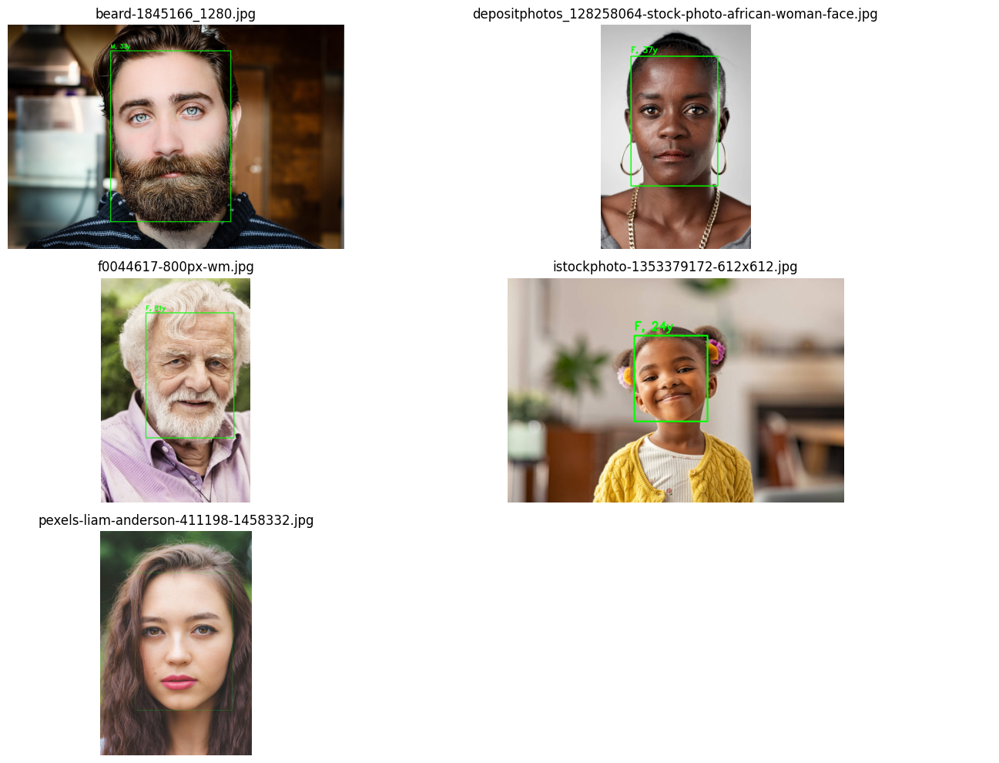

In [5]:
# ===== Example usage in notebook =====
folder_path = "data/"  # folder with images
analyzer = FaceAnalyzer(ctx_id=-1)  # CPU
analyzer.analyze_folder_grid(folder_path, rows=3, cols=2)

In [6]:
from transformers import AutoFeatureExtractor, AutoModelForImageClassification
import torch
from PIL import Image
import numpy as np

# Path to the folder containing your .safetensors model
model_name_or_path = "raffaelsiregar/utkface-race-classifications"

# Load model & feature extractor
model = AutoModelForImageClassification.from_pretrained(model_name_or_path, trust_remote_code=True)
extractor = AutoFeatureExtractor.from_pretrained(model_name_or_path, trust_remote_code=True)

# Put model in evaluation mode
model.eval()

Fetching 1 files: 100%|██████████| 1/1 [00:00<?, ?it/s]
e:\coffee-maps-survaillance\venv\Lib\site-packages\transformers\models\convnext\feature_extraction_convnext.py:30: FutureWarning: The class ConvNextFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ConvNextImageProcessor instead.
  warnings.warn(


ResNetForImageClassification(
  (resnet): ResNetModel(
    (embedder): ResNetEmbeddings(
      (embedder): ResNetConvLayer(
        (convolution): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activation): ReLU()
      )
      (pooler): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    )
    (encoder): ResNetEncoder(
      (stages): ModuleList(
        (0): ResNetStage(
          (layers): Sequential(
            (0): ResNetBottleNeckLayer(
              (shortcut): ResNetShortCut(
                (convolution): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (normalization): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              )
              (layer): Sequential(
                (0): ResNetConvLayer(
                  (convolution): Conv2d(64

In [7]:
def predict_race(face_crop):
    # Convert OpenCV BGR to PIL RGB
    img_pil = Image.fromarray(cv2.cvtColor(face_crop, cv2.COLOR_BGR2RGB))
    
    # Prepare input
    inputs = extractor(images=img_pil, return_tensors="pt")
    
    # Forward pass
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
        race_idx = torch.argmax(probs).item()
    
    # Get race label
    race_labels = model.config.id2label  # typically a dict like {0: 'White', 1: 'Black', ...}
    return race_labels[race_idx]


## now it's working

In [29]:
import os
import cv2
import insightface
from insightface.app import FaceAnalysis
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
from transformers import AutoFeatureExtractor, AutoModelForImageClassification
import faiss
from dataclasses import dataclass
from PIL import Image
import torch
import numpy as np
import cv2

In [43]:
class SexEnum:
    MALE = "M"
    FEMALE = "F"
    
@dataclass
class ClassificationResult:
    age: int
    sex: str
    race: str
    
@dataclass
class ClassificationMetadata:
    classification_result: ClassificationResult
    idx: int
    
class FaissIndexManager:
    def __init__(self, dim: int, threshold: float, faiss_index_path: str = "faiss_index/faiss_faces.index"):
        self.index = faiss.IndexFlatIP(dim)
        self.threshold = threshold
        self.faiss_index_path = faiss_index_path
        
    def add_embedding(self, embedding):
        self.index.add(embedding)
        
    def check_if_present(self, embedding) -> int | None:
        if self.index.ntotal > 0:  # check existing embeddings
            D, I = self.index.search(embedding, k=1)
            best_score = D[0][0]
            best_idx = I[0][0]

            if best_score > self.threshold:
                print(f"Embedding already seen: {best_idx} (score={best_score:.3f})")
                return best_idx
            else:
                print("New embedding detected, returning None")
                return None
        else:
            print("Index empty, returning None")
            return None
        
    def save(self):
        return faiss.write_index(self.index, self.faiss_index_path)
    def load(self):
        return faiss.read_index(self.faiss_index_path)

# FAISS index and metadata       
face_fid = FaissIndexManager(
    dim=512,
    threshold=0.5,
    faiss_index_path="faiss_index/faiss_faces.index"
)
metadata: list[ClassificationMetadata] = []

class FaceAnalyzer:
    def __init__(self, 
                 ctx_id=-1, 
                 det_size=(640, 640), 
                 race_model_path= None, 
                 load_previous_faces: bool = False # path to faiss index file
                 ):
        self.app = FaceAnalysis()
        self.app.prepare(ctx_id=ctx_id, det_size=det_size)
        
        if load_previous_faces:
            metadata = face_fid.load()

        # Load race model if provided
        self.race_model = None
        self.race_extractor = None
        
        # Define once in __init__
        self.race_transform = transforms.Compose([
            transforms.Resize((224, 224)),  # or model expected size
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225])
        ])

        if race_model_path:
            self.race_model = AutoModelForImageClassification.from_pretrained(
                race_model_path, trust_remote_code=True
            )
            self.race_extractor = AutoFeatureExtractor.from_pretrained(
                race_model_path, trust_remote_code=True
            )
            self.race_model.eval()
            # Map numeric labels to names
            self.race_labels = self.race_model.config.id2label

    def analyze_image(self, img):
        faces = self.app.get(img)
        return faces

    def predict_race(self, face, img, ensemble=True, threshold=0.5):
        """
        Predict race for a detected face using landmarks-aware cropping and optional ensemble.
            Landmark-aware crop → reduces background noise.
            Ensemble → averages multiple slightly shifted crops to reduce random misclassifications.
            Resize + normalization → matches transformer expectations.
            Confidence threshold → ignore low-confidence predictions.   
        Returns: (race_label, confidence)
        """
        if self.race_model is None:
            return "unknown", 0.0

        # Get bounding box and landmarks
        x1, y1, x2, y2 = map(int, face.bbox)
        h, w, _ = img.shape
        x1, y1, x2, y2 = max(0, x1), max(0, y1), min(w, x2), min(h, y2)

        # Use landmarks for tighter crop if available
        if hasattr(face, 'kps') and face.kps is not None:
            # landmarks: 5 or 68 points (x, y)
            kps = np.array(face.kps)
            x_min = max(0, int(kps[:,0].min()))
            y_min = max(0, int(kps[:,1].min()))
            x_max = min(w, int(kps[:,0].max()))
            y_max = min(h, int(kps[:,1].max()))
            x1, y1, x2, y2 = x_min, y_min, x_max, y_max

        # Crop the face
        face_crop = img[y1:y2, x1:x2]
        if face_crop.size == 0:
            return "unknown", 0.0

        # Prepare crops for ensemble
        crops = [face_crop]
        if ensemble:
            # Slight shifts
            dh, dw = int(0.05*(y2-y1)), int(0.05*(x2-x1))
            crops.append(img[max(0,y1-dh):min(h,y2+dh), max(0,x1-dw):min(w,x2+dw)])
            crops.append(img[max(0,y1+dh):min(h,y2-dh), max(0,x1+dw):min(w,x2-dw)])

        probs_list = []
        for crop in crops:
            # Convert BGR -> RGB PIL
            img_pil = Image.fromarray(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
            # Resize to model expected size
            img_pil = img_pil.resize((224,224))
            # Transform
            img_tensor = self.race_transform(img_pil).unsqueeze(0)

            with torch.no_grad():
                outputs = self.race_model(img_tensor)
                probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
                probs_list.append(probs)

        # Average ensemble probabilities
        probs_avg = torch.mean(torch.stack(probs_list), dim=0)
        max_prob, race_idx = torch.max(probs_avg, dim=-1)

        if max_prob.item() < threshold:
            return "unknown", 0.0

        return self.race_labels[race_idx.item()], max_prob.item()

    def detect_gender(self, face) -> str:
        return SexEnum.MALE if face.gender == 1 else SexEnum.FEMALE
    def detect_age(self, face) -> int:
        return int(face.age)
    def detect_race(self, face, img) -> str:
        race, percentage = self.predict_race(face, img)
        return f"{race}, {percentage}%"
    def detect_(self, face, img) -> ClassificationResult:
        gender = self.detect_gender(face)
        age = self.detect_age(face)
        race = self.detect_race(face, img)
        
        return ClassificationResult(age, gender, race)

    def draw_face(self, face, img, cl_result):
        # draw rctangle
        x1, y1, x2, y2 = map(int, face.bbox)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        # add label
        label = f"{cl_result.sex}, {cl_result.age}y, {cl_result.race}"
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        return img

    def show_images_grid(self, imgs, titles=None, rows=1, cols=3):
        fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
        axes = axes.flatten()
        for i in range(rows * cols):
            if i < len(imgs):
                img_rgb = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB)
                axes[i].imshow(img_rgb)
                axes[i].set_title(titles[i] if titles else "")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

    def check_if_face_present(self, embedding) -> int | None:
        """
            Searches for that face embedding in FAISS, if similarity > threshold -> return index in metadata, else -> None, indicating absence
        """
        return face_fid.check_if_present(embedding)

    def analyze_folder_grid(self, folder_path, rows=1, cols=3):
        image_files = [f for f in os.listdir(folder_path)
                       if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        labeled_images = []
        titles = []
        for file_name in image_files:
            img_path = os.path.join(folder_path, file_name)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Cannot read {file_name}")
                continue
            faces = self.analyze_image(img)
            
            for face in faces:
                embedding = face.normed_embedding.astype("float32").reshape(1, -1)
                
                search_face = self.check_if_face_present(embedding)
                if search_face is not None:
                    # this face was already detected
                    classification_report = metadata[search_face].classification_result
                    img_labeled = self.draw_face(face, img, classification_report)
                else:
                    # new face - need to classify it
                    classification_report = self.detect_(face, img)
                    img_labeled = self.draw_face(face, img, classification_report)
                    
                    # Add new person
                    face_fid.add_embedding(embedding)
                    metadata.append(ClassificationMetadata(
                        classification_report, 
                        len(metadata) - 1  # new ID
                    )) 
                labeled_images.append(img_labeled)
                titles.append(file_name)

            if len(labeled_images) == rows * cols:
                self.show_images_grid(labeled_images, titles, rows, cols)
                labeled_images, titles = [], []

        if labeled_images:
            self.show_images_grid(labeled_images, titles, rows, cols)
    def save_faiss_index(self):
        face_fid.save()

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127

Fetching 1 files: 100%|██████████| 1/1 [00:00<?, ?it/s]


Index empty, returning None
New embedding detected, returning None
New embedding detected, returning None


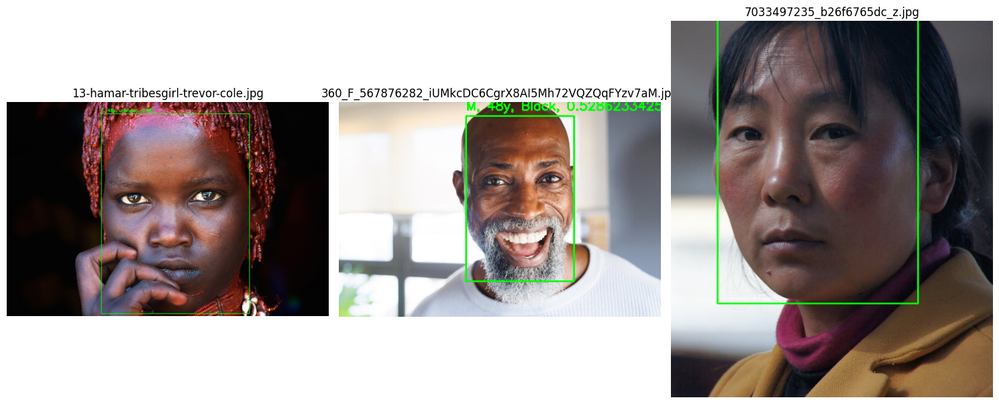

New embedding detected, returning None
New embedding detected, returning None
New embedding detected, returning None


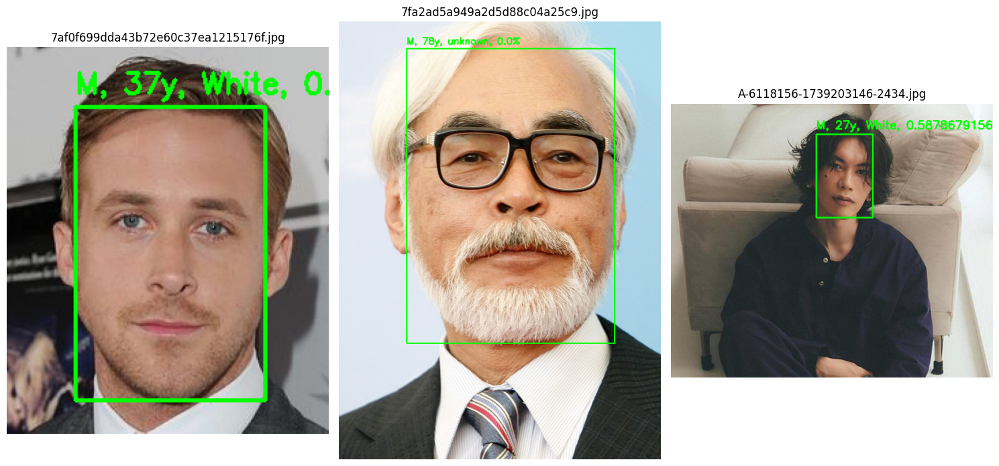

New embedding detected, returning None
Cannot read beautiful-african-woman-face-portrait-close-up_53876-148041.jpg
New embedding detected, returning None
New embedding detected, returning None


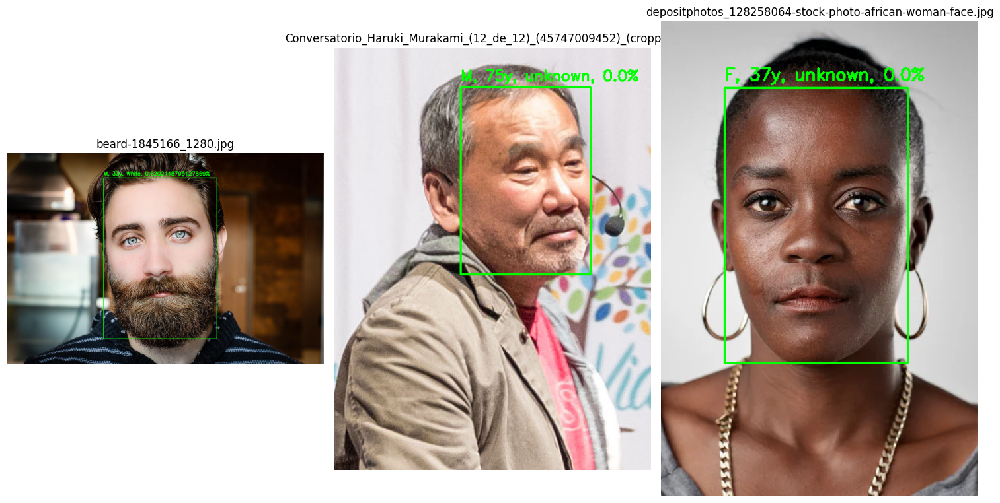

New embedding detected, returning None
New embedding detected, returning None
New embedding detected, returning None


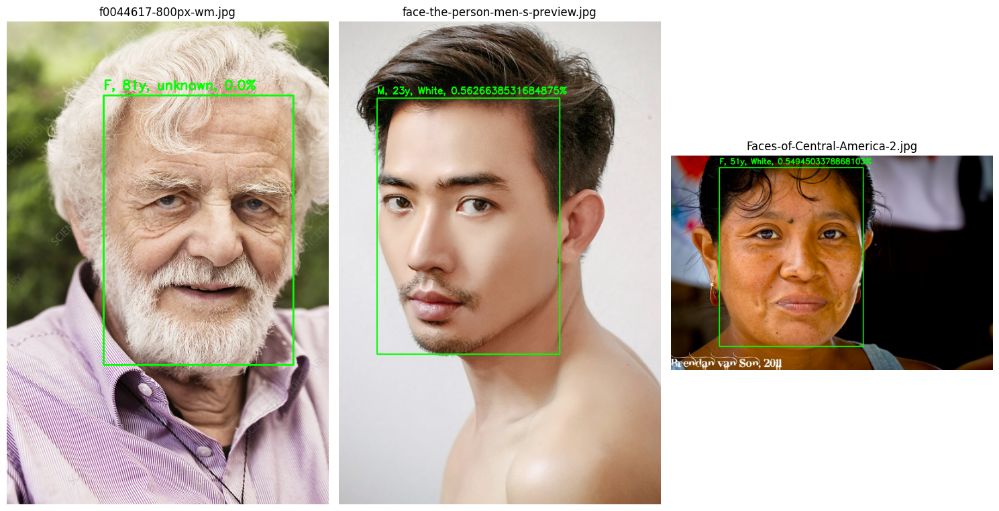

New embedding detected, returning None
Embedding already seen: 12 (score=0.785)
New embedding detected, returning None


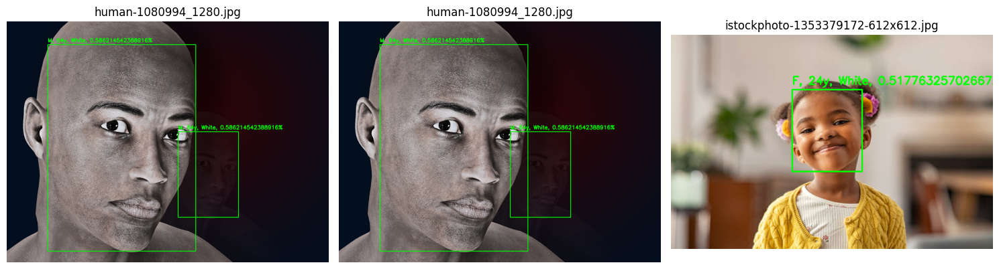

New embedding detected, returning None
New embedding detected, returning None
New embedding detected, returning None


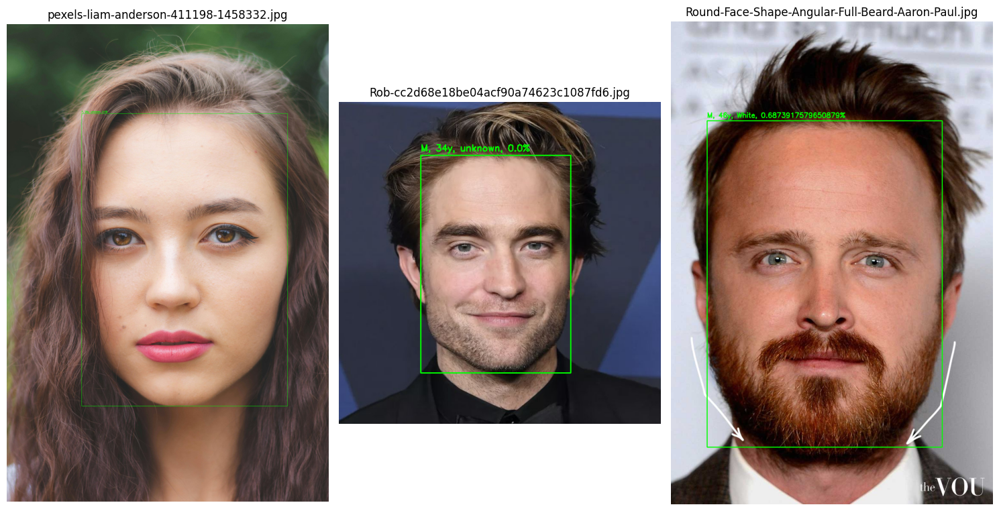

New embedding detected, returning None
New embedding detected, returning None
New embedding detected, returning None


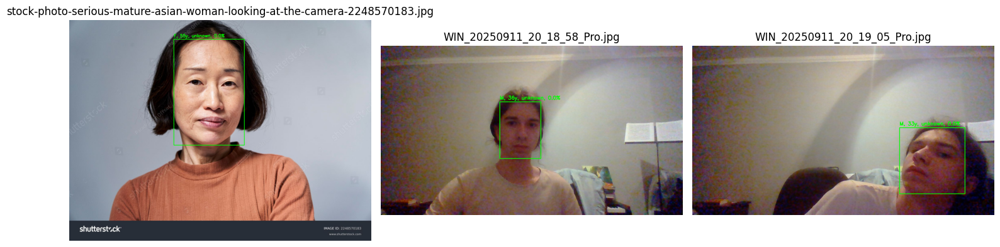

Embedding already seen: 18 (score=0.590)
Embedding already seen: 18 (score=0.619)
New embedding detected, returning None


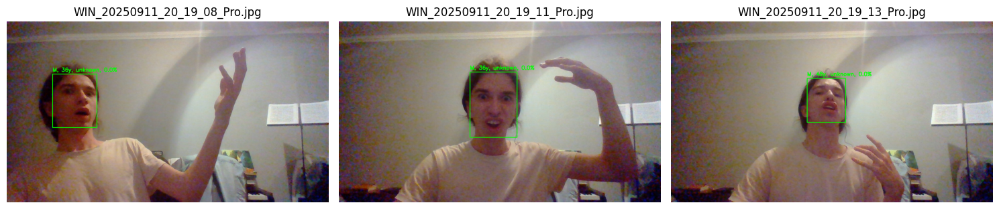

In [44]:
folder_path = "data/"  # folder with images
race_model_path = "raffaelsiregar/utkface-race-classifications"  # folder containing model and config

analyzer = FaceAnalyzer(ctx_id=-1, race_model_path=race_model_path)
analyzer.analyze_folder_grid(folder_path)
analyzer.save_faiss_index()

In [ ]:
folder_path = "data/"  # folder with images
race_model_path = "raffaelsiregar/utkface-race-classifications"  # folder containing model and config

analyzer_2 = FaceAnalyzer(ctx_id=-1, race_model_path=race_model_path, load_previous_faces=True)
analyzer_2.analyze_folder_grid(folder_path)

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Omen/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
